In [4]:
import xarray as xr
import numpy as np
from sunpy.visualization.colormaps import cm

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from sunpy.map import Map

### Open Zarr array

In [5]:
zarr_path = '/d0/euv/aia/preprocessed/aia_hmi_stacks_2010_2023_1d_full_ir.zarr'

In [6]:
aia_hmi_stacks = xr.open_zarr(zarr_path)
aia_hmi_stacks

<xarray.Dataset>
Dimensions:  (t_obs: 4043, channel: 8, x: 4096, y: 4096)
Coordinates:
  * channel  (channel) object 'aia094' 'aia131' 'aia171' ... 'aia335' 'hmilos'
  * t_obs    (t_obs) datetime64[ns] 2010-06-02T07:48:09.558000 ... 2023-07-14...
Dimensions without coordinates: x, y
Data variables:
    aia_hmi  (t_obs, channel, x, y) float32 dask.array<chunksize=(1, 2, 4096, 4096), meta=np.ndarray>

In [7]:
aia_hmi_stacks.aia_hmi

<xarray.DataArray 'aia_hmi' (t_obs: 4043, channel: 8, x: 4096, y: 4096)>
dask.array<open_dataset-aia_hmi, shape=(4043, 8, 4096, 4096), dtype=float32, chunksize=(1, 2, 4096, 4096), chunktype=numpy.ndarray>
Coordinates:
  * channel  (channel) object 'aia094' 'aia131' 'aia171' ... 'aia335' 'hmilos'
  * t_obs    (t_obs) datetime64[ns] 2010-06-02T07:48:09.558000 ... 2023-07-14...
Dimensions without coordinates: x, y
Attributes: (12/54)
    acs_cgt:   ['GT3', 'GT3', 'GT3', 'GT3', 'GT3', 'GT3', 'GT3', 'GT3', 'GT3'...
    acs_eclp:  ['NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', '...
    acs_mode:  ['SCIENCE', 'SCIENCE', 'SCIENCE', 'SCIENCE', 'SCIENCE', 'SCIEN...
    acs_safe:  ['NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', 'NO', '...
    acs_sunp:  ['YES', 'YES', 'YES', 'YES', 'YES', 'YES', 'YES', 'YES', 'YES'...
    asd_rec:   ['sdo.lev0_asd_0004[:#2682303]', 'sdo.lev0_asd_0004[:#2703912]...
    ...        ...
    t_obs:     ['2010-06-02T07:48:09.558', '2010-06-03T07:48:09.551', '2010-0...
    t_rec:     ['2010-06-02T07:48:02.000', '2010-06-03T07:48:02.000', '2010-0...
    telescop:  ['SDO/AIA', 'SDO/AIA', 'SDO/AIA', 'SDO/AIA', 'SDO/AIA', 'SDO/A...
    waveunit:  ['angstrom', 'angstrom', 'angstrom', 'angstrom', 'angstrom', '...
    x0_mp:     [2047.87, 2047.87, 2047.43994, 2047.43994, 2047.43994, 2047.43...
    y0_mp:     [2048.67993, 2048.67993, 2049.27002, 2049.27002, 2049.27002, 2...

In [8]:
np.max(aia_hmi_stacks.aia_hmi[0,3:6,:,:].load().data, axis=(1,2))

array([11.889038, 14.446126, 21.703718], dtype=float32)

In [9]:
np.max(np.arcsinh(aia_hmi_stacks.aia_hmi[0,3:6,:,:].load().data), axis=(1,2))

array([3.170528 , 3.3647692, 3.771161 ], dtype=float32)

### Create list of meta dictionaries

In [10]:
meta_dicts = []

for i in range(aia_hmi_stacks.aia_hmi.shape[0]):
    meta_dict = {}
    for key in aia_hmi_stacks.aia_hmi.attrs.keys():
        meta_dict[key] = aia_hmi_stacks.aia_hmi.attrs[key][i]
    meta_dicts.append(meta_dict)

### Plot random index

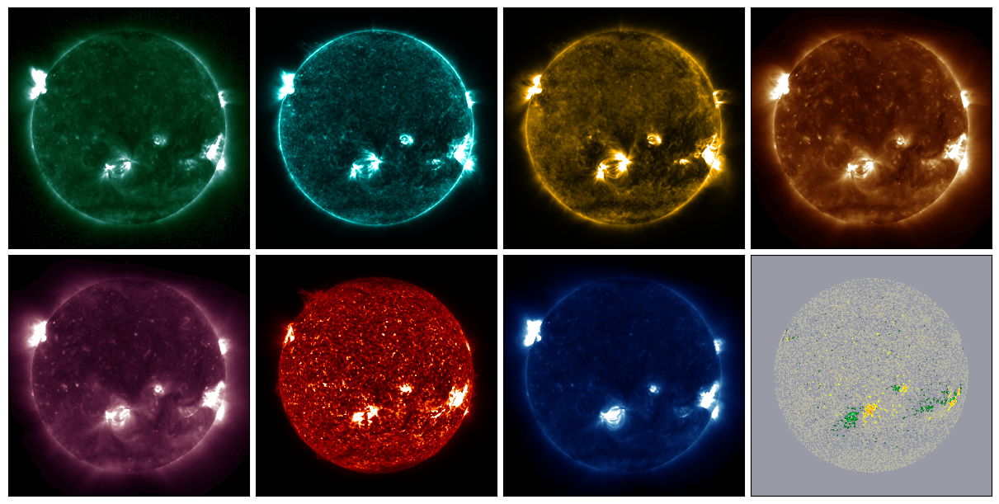

In [11]:
index = np.random.choice(np.arange(aia_hmi_stacks.t_obs.shape[0]))
t_obs = aia_hmi_stacks.t_obs[index].data

fig = plt.figure(figsize=[12,6], constrained_layout=True)
spec = fig.add_gridspec(ncols=4, nrows=2, wspace=0, hspace=0)

for i, channel in enumerate(aia_hmi_stacks.channel):
    # Set colormap
    if channel.data == 'aia094':
        cmap = 'sdoaia94'
    elif 'hmi' in str(channel.data):
        cmap = 'hmimag'
    else:
        cmap = 'sdo' + str(channel.data)

    # Set vlim
    loaded_data = aia_hmi_stacks.aia_hmi.loc[t_obs,channel.data, :, :].load()
    if 'hmi' in str(channel.data):
        vmax = 1500 # np.nanpercentile(np.abs(loaded_data), 99)
        vmin = -vmax
    else:
        vmax = np.nanpercentile(np.abs(loaded_data), 99)
        vmin = 0

    ax = fig.add_subplot(spec[i//4, i%4])
    ax.imshow(loaded_data.data, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_xticks([])
    ax.set_yticks([])
    

### Test the ability to use sunpy

Observatory,SDO
Instrument,HMI SIDE1
Detector,HMI
Measurement,
Wavelength,Unknown
Observation Date,2010-08-15 07:48:02
Exposure Time,Unknown
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.60010898 0.60010898] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

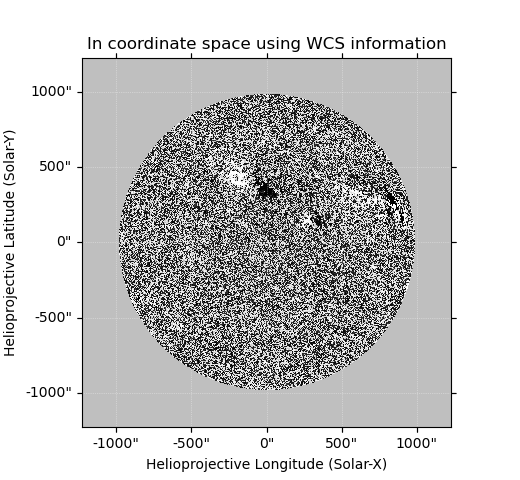
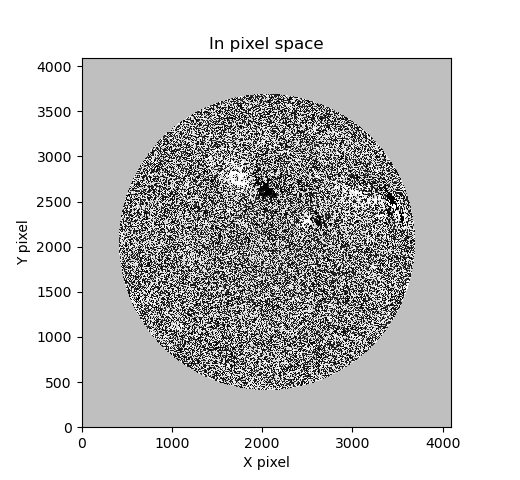
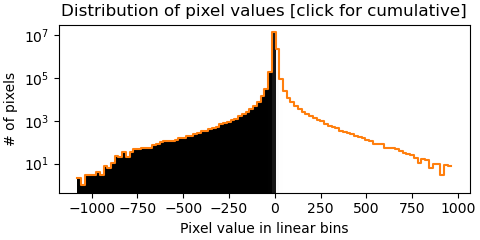
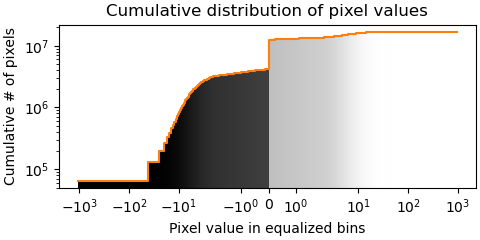

In [12]:
meta = meta_dicts[index]
meta['telescop'] = 'SDO/HMI'
meta['instrume'] = 'HMI_SIDE1'

Map(loaded_data.data, meta)

In [13]:
aia_image = aia_hmi_stacks.aia_hmi.loc[t_obs,'aia171', :, :].load()

Observatory,SDO
Instrument,AIA 4
Detector,AIA
Measurement,171.0 Angstrom
Wavelength,171.0 Angstrom
Observation Date,2010-08-15 07:48:02
Exposure Time,Unknown
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.60010898 0.60010898] arcsec / pix
Reference Pixel,[2047.5 2047.5] pix

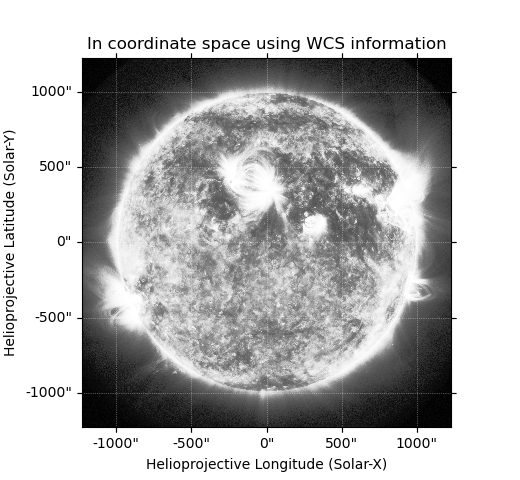
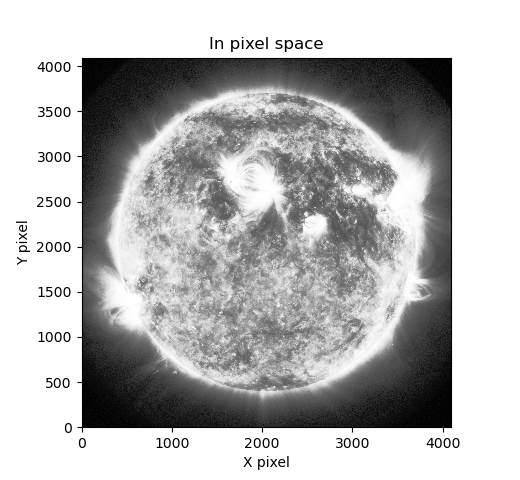
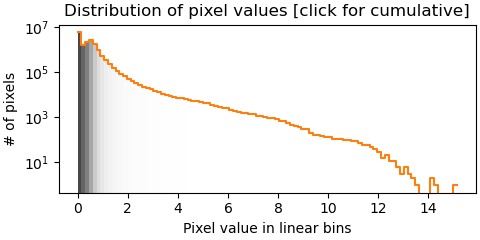
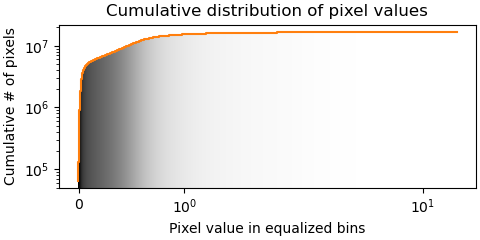

In [14]:
meta = meta_dicts[index]
meta['telescop'] = 'SDO/AIA'
meta['instrume'] = 'AIA_4'
meta['wavelnth'] = 171
meta['waveunit'] = 'angstrom'

Map(aia_image.data, meta)